# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [1]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [2]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(-10.9284)


## Sampling from categorical probabilities with given probabilities

In [3]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(1)


## Animating data

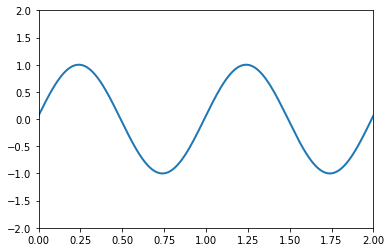

In [4]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

Text(0,0.5,'Probability')

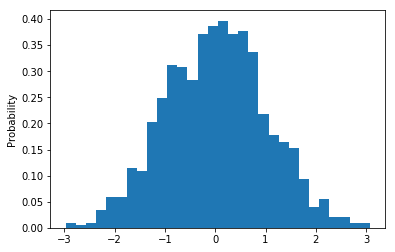

In [5]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability')

## Task 1

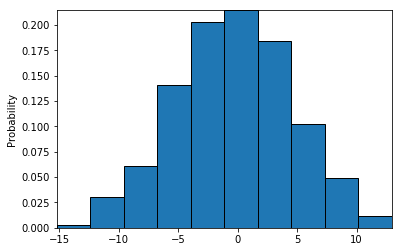

In [9]:
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.path as path
import matplotlib.animation as animation

def get_variable(mean = 0, variance = 5):
    return pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))

variables = [get_variable() for _ in range(1000)]
n, bins = np.histogram(variables)

left = np.array(bins[:-1])
right = np.array(bins[1:])
bottom = np.zeros(len(left))
top = bottom + n
nrects = len(left)

nverts = nrects * (1 + 3 + 1)
verts = np.zeros((nverts, 2))
codes = np.ones(nverts, int) * path.Path.LINETO
codes[0::5] = path.Path.MOVETO
codes[4::5] = path.Path.CLOSEPOLY
verts[0::5, 0] = left
verts[0::5, 1] = bottom
verts[1::5, 0] = left
verts[1::5, 1] = top
verts[2::5, 0] = right
verts[2::5, 1] = top
verts[3::5, 0] = right
verts[3::5, 1] = bottom

patch = None

def animate(i):
    n, _ = np.histogram(variables[:i], bins)
    if i > 0:
        n = n / i
    top = bottom + n
    verts[1::5, 1] = top
    verts[2::5, 1] = top
    
    if top.max() > 0:
        ax.set_ylim(0, top.max())
    return [patch, ]

fig, ax = plt.subplots()
barpath = path.Path(verts, codes)
patch = patches.PathPatch(barpath)
ax.add_patch(patch)

ax.set_xlim(left[0], right[-1])
ax.set_ylabel('Probability')

ani = animation.FuncAnimation(fig, animate, len(variables), repeat=False, blit=True)
HTML(ani.to_jshtml())

## Task 2


I - person is ill
H - person is healthy
+ - positive test
- - negative test

P(I) = x
P(H) = 1 - x

P(+|H) = 0.02
P(-|H) = 0.98
P(+|I) = 0.99
P(-|I) = 0.01

Bayes equation for P(I|+) = P(+|I)*P(I)/(P(+|I)*P(I) + P(+|H)*P(H))


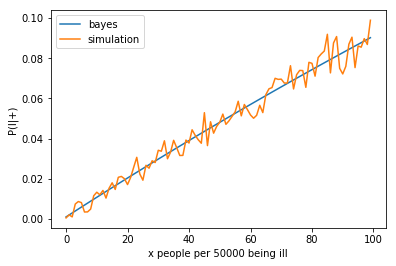

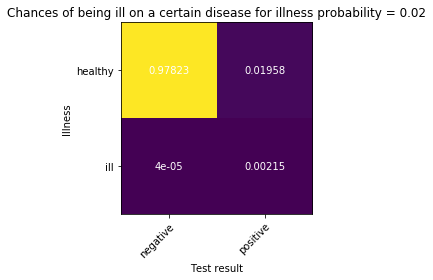

In [21]:
def generate_person():
    is_ill = np.random.uniform() < ill_prob
    if is_ill:
        is_positive_test = np.random.uniform() < 0.99
    else:
        is_positive_test = np.random.uniform() < 0.02
    return (is_ill, is_positive_test)

def generate_population():
    pop = []
    for _ in range(test_sample):
        pop.append(generate_person())
    return pop

def draw_matrix():
    matrix = np.zeros((2,2))
    for p in population:
        matrix[int(p[0])][int(p[1])] += 1
    matrix /= test_sample
    
    illness = ["healthy", "ill"]
    test = ["negative","positive"]

    fig, ax = plt.subplots()
    im = ax.imshow(matrix)

    ax.set_xticks(np.arange(len(test)))
    ax.set_yticks(np.arange(len(illness)))
    ax.set_xticklabels(test)
    ax.set_yticklabels(illness)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    for i in range(len(illness)):
        for j in range(len(test)):
            text = ax.text(j, i, matrix[i, j],
                           ha="center", va="center", color="w")

    ax.set_title("Chances of being ill on a certain disease for illness probability = 0.02")
    ax.set_xlabel('Test result')
    ax.set_ylabel('Illness')
    fig.tight_layout()

    plt.show()

def calculate_from_simulation():
    positive_test_population = [int(pop[0]) for pop in population if pop[1]]
    ill = sum(positive_test_population)
    all_positive = len(positive_test_population)
    return ill / all_positive

def calculates_from_bayes():
    return 0.99 * ill_prob / ( 0.99 * ill_prob + 0.02 * (1 - ill_prob))

print('''
I - person is ill
H - person is healthy
+ - positive test
- - negative test
''')

print("P(I) = x")
print("P(H) = 1 - x")
print('''
P(+|H) = 0.02
P(-|H) = 0.98
P(+|I) = 0.99
P(-|I) = 0.01
''')
print("Bayes equation for P(I|+) = P(+|I)*P(I)/(P(+|I)*P(I) + P(+|H)*P(H))")

test_sample = 100000

bayes_results = []
sim_results = []

for i in range(1, 101):
    ill_prob = i / 50000
    population = generate_population()
    bayes_results.append(calculates_from_bayes())
    sim_results.append(calculate_from_simulation())

plt.plot(bayes_results, label='bayes')
plt.plot(sim_results, label='simulation')
plt.legend(loc='upper left')
plt.xlabel('x people per 50000 being ill')
plt.ylabel('P(I|+)')
    
draw_matrix()